In [1]:
 import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()

In [2]:
train=pd.read_csv('data.csv')

In [3]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [40]:
train

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500
5,BMW,1 Series,2012,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,31200
6,BMW,1 Series,2012,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,26,17,3916,44100
7,BMW,1 Series,2012,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,39300
8,BMW,1 Series,2012,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,36900
9,BMW,1 Series,2013,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,27,18,3916,37200


In [5]:
year= train["Year"]

In [6]:
transmission= train["Transmission Type"]
transmission.value_counts()

AUTOMATIC           8266
MANUAL              2935
AUTOMATED_MANUAL     626
DIRECT_DRIVE          68
UNKNOWN               19
Name: Transmission Type, dtype: int64

In [7]:
manual=train[train["Transmission Type"]=="MANUAL"]
#manual

In [8]:
unknown=train[train["Transmission Type"]=="UNKNOWN"]
#unknown

In [9]:
duplicates=pd.concat([manual,unknown],axis = 0)
automatic=train.drop(duplicates.index)
#automatic

In [10]:
msrp=pd.DataFrame(train['MSRP'])

In [11]:
msrp.describe()

,MSRP
count,1.191400e+04
mean,4.059474e+04
std,6.010910e+04
min,2.000000e+03
25%,2.100000e+04
50%,2.999500e+04
75%,4.223125e+04
max,2.065902e+06


In [12]:
pop=pd.DataFrame(train['Popularity'])

In [13]:
make = train["Make"]
make=make.astype("category")
#make.value_counts()

In [ ]:
#make_filtered.value_counts()

In [ ]:
#make_filtered2.value_counts()

In [14]:
jointDF = pd.concat([msrp,make],axis = 1).reindex(msrp.index)
#jointDF

In [15]:
filtered=train[train["MSRP"]==2000]
#filtered

In [16]:
#duplicates=pd.merge(train,filtered)
train_filtered=train.drop(filtered.index)
train_filtered.shape

(10878, 16)

In [17]:
make_filtered=pd.DataFrame(train_filtered["Make"])
make_filtered=make_filtered.astype("category")

#make_filtered.value_counts()

In [18]:
msrp_filtered=pd.DataFrame(train_filtered["MSRP"])
jointDF3 = pd.concat([msrp_filtered,make_filtered],axis = 1).reindex(msrp_filtered.index)


In [19]:
jointDF["MSRP"].describe()

count    1.191400e+04
mean     4.059474e+04
std      6.010910e+04
min      2.000000e+03
25%      2.100000e+04
50%      2.999500e+04
75%      4.223125e+04
max      2.065902e+06
Name: MSRP, dtype: float64

In [20]:
jointDF3["MSRP"].describe()

count    1.087800e+04
mean     4.427043e+04
std      6.165918e+04
min      2.002000e+03
25%      2.359125e+04
50%      3.160250e+04
75%      4.388625e+04
max      2.065902e+06
Name: MSRP, dtype: float64

In [23]:
jointDF4["MSRP"].describe()

count    1.026700e+04
mean     4.672528e+04
std      6.261583e+04
min      1.013500e+04
25%      2.490250e+04
50%      3.260000e+04
75%      4.501750e+04
max      2.065902e+06
Name: MSRP, dtype: float64

In [22]:
filtered2=train[train["MSRP"]<=10000]
train_filtered2=train.drop(filtered2.index)
#train_filtered.shape
msrp_filtered2=pd.DataFrame(train_filtered2["MSRP"])
make_filtered2=pd.DataFrame(train_filtered2["Make"])
make_filtered2=make_filtered2.astype("category")
jointDF4 = pd.concat([msrp_filtered2,make_filtered2],axis = 1).reindex(msrp_filtered2.index)
#jointDF4


Plot of the count of Make from original data set

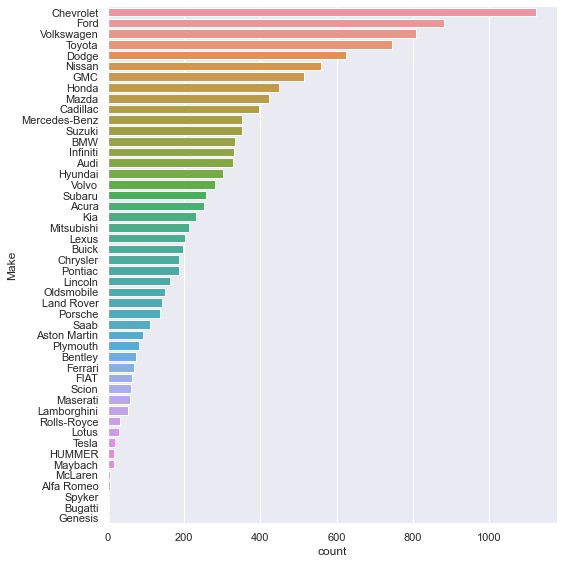

In [24]:
make=pd.DataFrame(train['Make'])
sb.catplot(y = 'Make', data = jointDF, 
           kind = "count", 
           height = 8, 
           order = jointDF['Make'].value_counts().index)

Plot of the count of Make data after filtering out the MSRP 2000 data

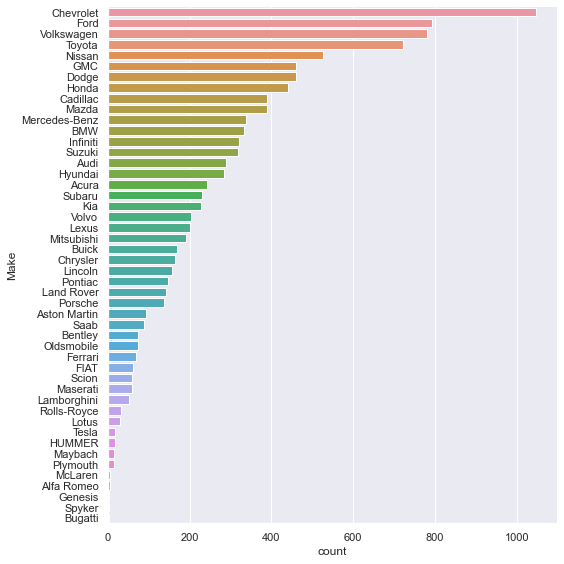

In [26]:
sb.catplot(y = 'Make', data = jointDF3, 
           kind = "count", 
           height = 8, 
           order = jointDF3['Make'].value_counts().index)

Plot of the count of Make data after filtering the MSRP in the range of above 2000 and less equal to 10000

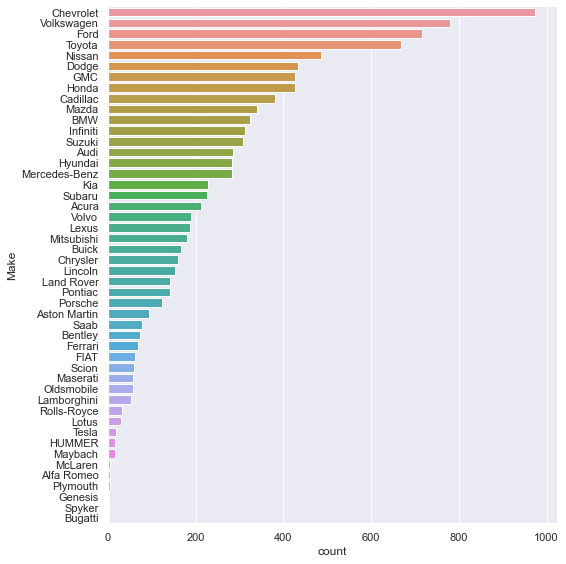

In [27]:
sb.catplot(y = 'Make', data = jointDF4, 
           kind = "count", 
           height = 8, 
           order = jointDF4['Make'].value_counts().index)

Original Data plot of MSRP against the make

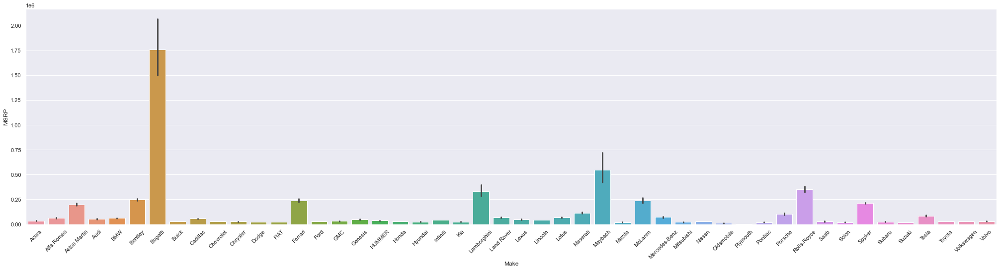

In [28]:
f = plt.figure(figsize=(35, 8))
sb.barplot(x = 'Make', y = 'MSRP', data = jointDF) 
           #order = jointDF.groupby('Make')['MSRP'].median().sort_values().index)

# Tilt the x-axis labels for better readability
plt.xticks(rotation=45);

Plot of MSRP against the Make after filtering out the data whose MSRP is 2000

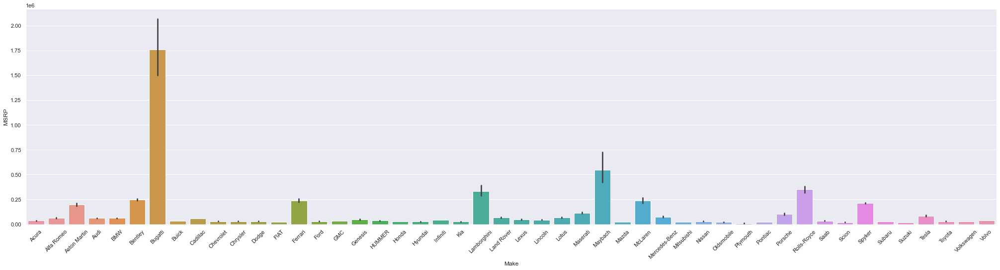

In [29]:
f = plt.figure(figsize=(35, 8))
sb.barplot(x = 'Make', y = 'MSRP', data = jointDF3) 
           #order = jointDF.groupby('Make')['MSRP'].median().sort_values().index)

# Tilt the x-axis labels for better readability
plt.xticks(rotation=45);

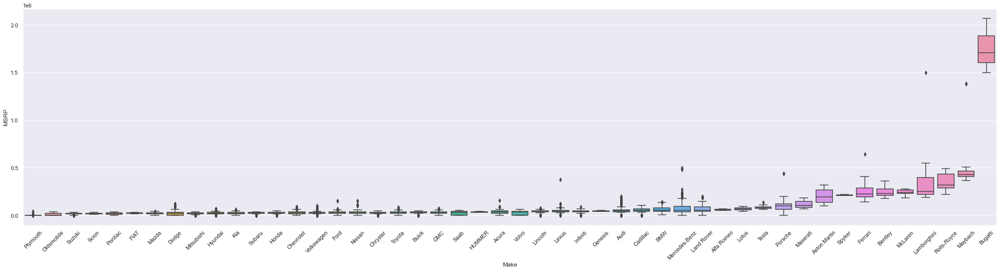

In [30]:
f = plt.figure(figsize=(35, 8))
sb.boxplot(x = 'Make', y = 'MSRP', data = jointDF, 
           order = jointDF.groupby('Make')['MSRP'].median().sort_values().index)

# Tilt the x-axis labels for better readability
plt.xticks(rotation=45);

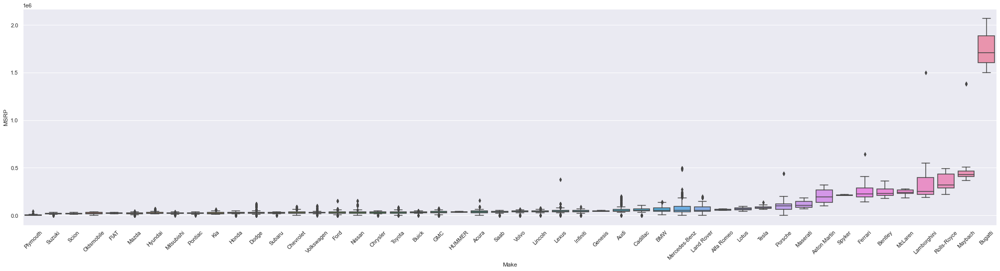

In [31]:
f = plt.figure(figsize=(35, 8))
sb.boxplot(x = 'Make', y = 'MSRP', data = jointDF3, 
           order = jointDF3.groupby('Make')['MSRP'].median().sort_values().index)

# Tilt the x-axis labels for better readability
plt.xticks(rotation=45);

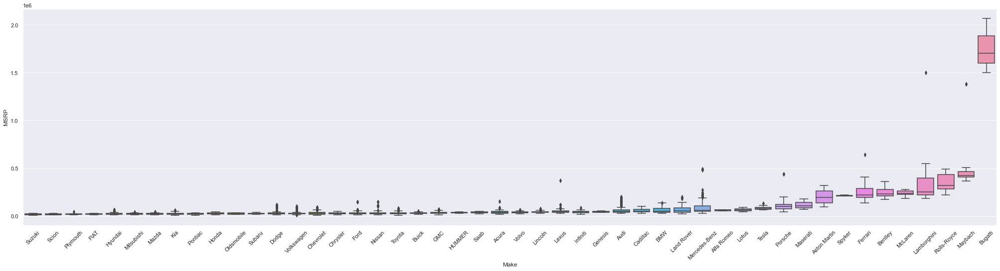

In [32]:
f = plt.figure(figsize=(35, 8))
sb.boxplot(x = 'Make', y = 'MSRP', data = jointDF4, 
           order = jointDF4.groupby('Make')['MSRP'].median().sort_values().index)

# Tilt the x-axis labels for better readability
plt.xticks(rotation=45);

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.,
        1800.]),
 [])

<Figure size 2520x576 with 0 Axes>

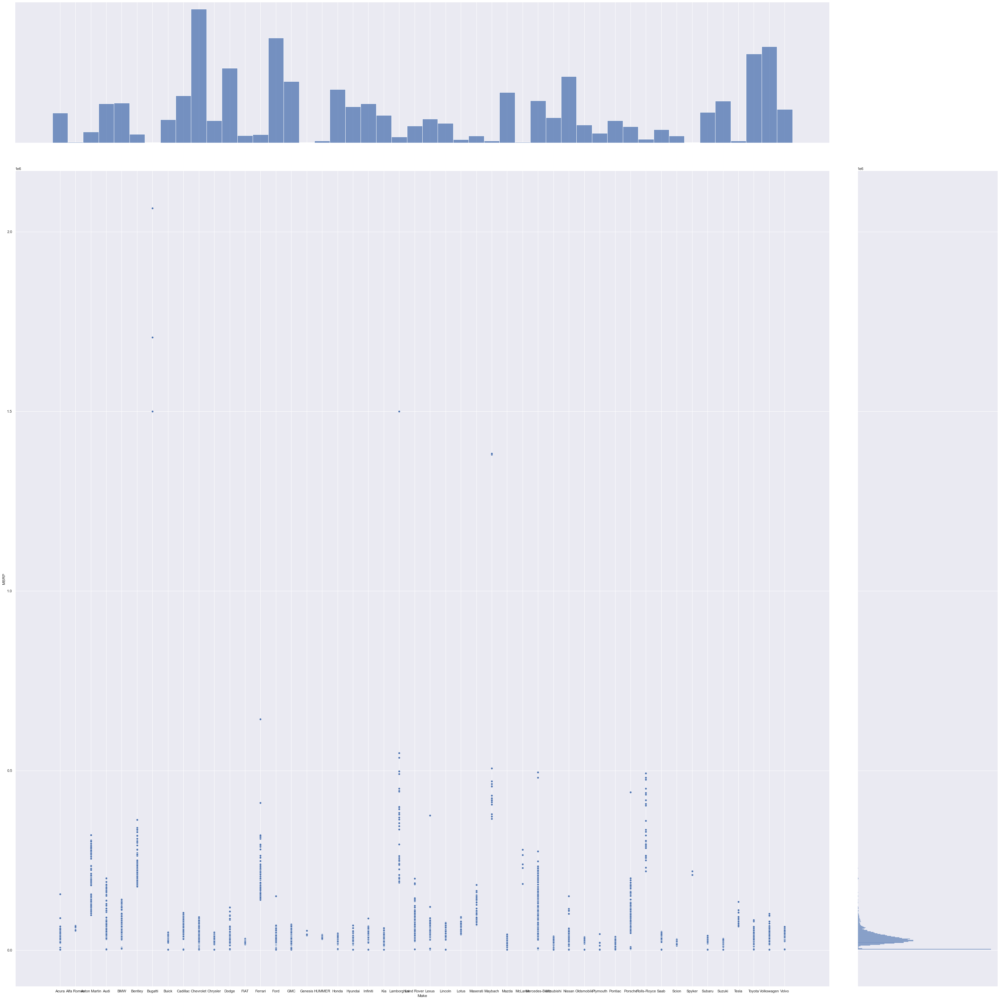

In [38]:
f = plt.figure(figsize=(35, 8))
sb.jointplot(x = "Make", y = "MSRP", data = jointDF, height =42)
plt.xticks(rotation=45)

(array([  0., 100., 200., 300., 400., 500., 600., 700.]), [])

<Figure size 2520x576 with 0 Axes>

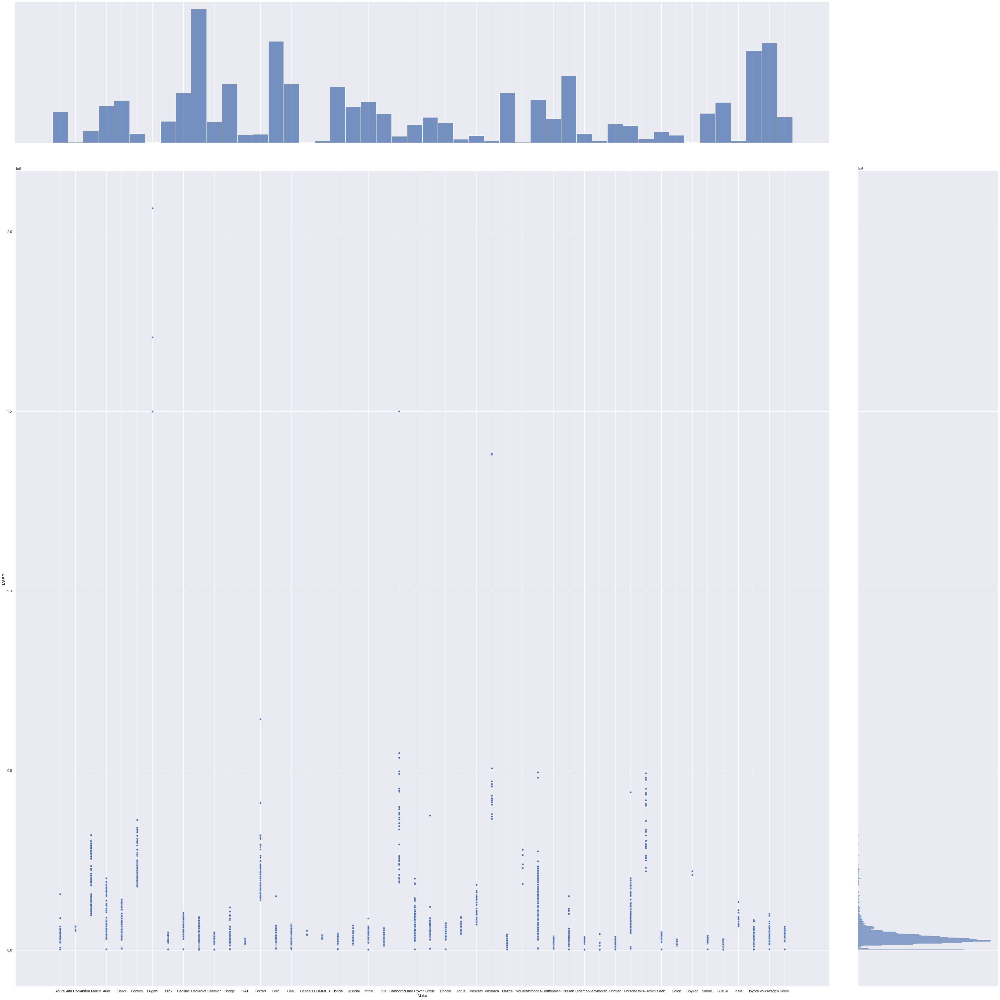

In [37]:
f = plt.figure(figsize=(35, 8))
sb.jointplot(x = "Make", y = "MSRP", data = jointDF3, height =42)
plt.xticks(rotation=45)

(array([  0., 100., 200., 300., 400., 500., 600., 700., 800.]), [])

<Figure size 2520x576 with 0 Axes>

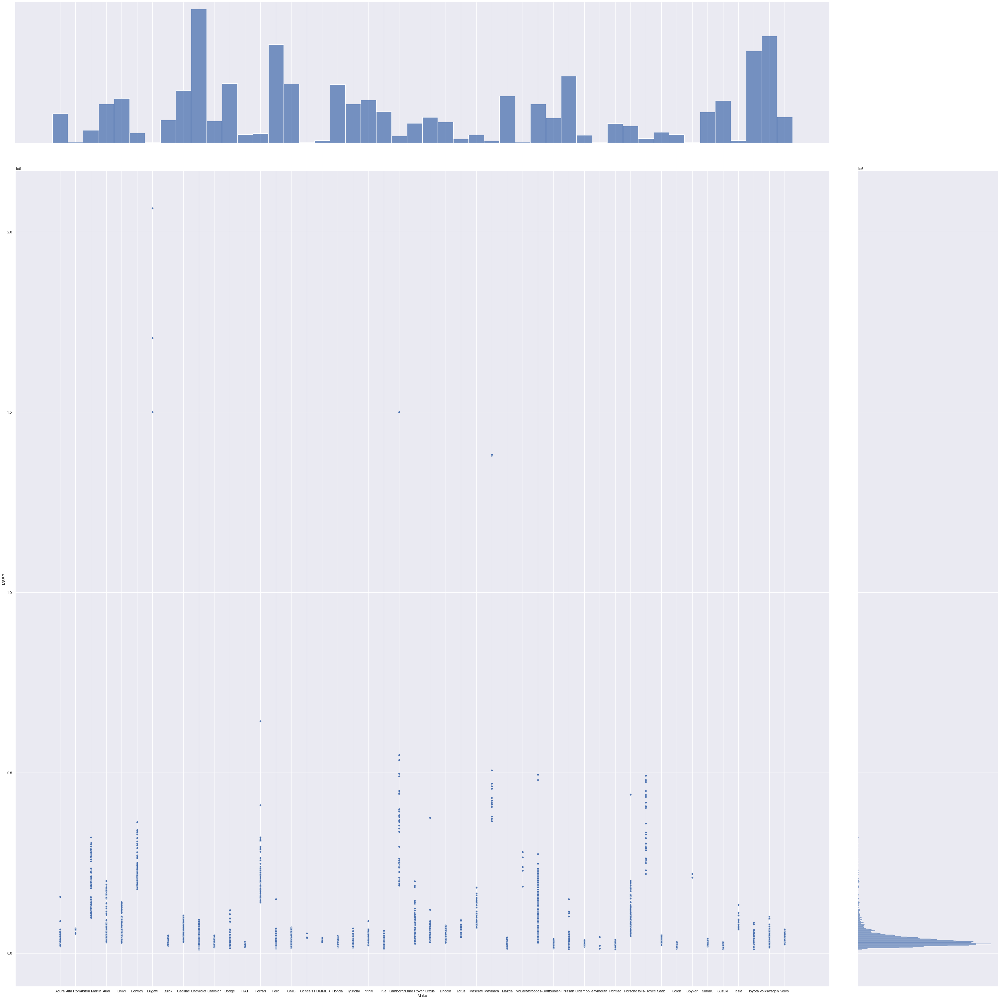

In [33]:
f = plt.figure(figsize=(35, 8))
sb.jointplot(x = "Make", y = "MSRP", data = jointDF4, height =42)
plt.xticks(rotation=45)

filter out bugatti. Use the top 4 make to do a correlation with the msrp.

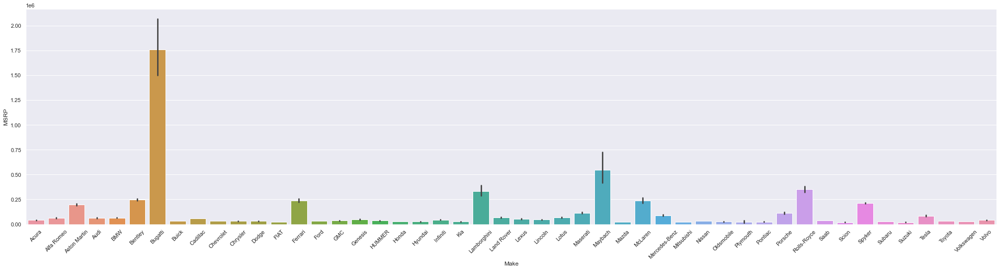

In [34]:
f = plt.figure(figsize=(35, 8))
sb.barplot(x = 'Make', y = 'MSRP', data = jointDF4) 
           #order = jointDF.groupby('Make')['MSRP'].median().sort_values().index)

# Tilt the x-axis labels for better readability
plt.xticks(rotation=45);


do filter_rule = (2000 == train_set["MSRP"])
filter_set = train_set[filter_rule]
then display
display year, make, msrp
replot rest of data
do random 80:20
which feature affect price most(boxplot, regression etc)


In [35]:
jointDF2 = pd.concat([msrp,year],axis = 1).reindex(msrp.index)
#jointDF2

In [ ]:

 #sb.barplot(y = "Year", x = "MSRP", data = jointDF2)

In [ ]:
#plt.bar("Year", "MSRP", data = jointDF2, color = "blue")
#plt.xlabel("Year")
#plt.ylabel("MSRP")
#plt.title("Car")
#plt.show()

In [ ]:
#plt.style.use('seaborn')
#sb.set_style('whitegrid')
#plt.figure(figsize=(15, 3))
#train.isnull().mean()

In [36]:
mark =  pd.DataFrame(train["Market Category"])
train_filterss=train.drop(mark,axis=1)
#train_filterss

#df = pd.read_csv("newdata.csv",index_col=0)
#df = df.drop("Max",axis=0)

In [ ]:
#make_filtered.describe()

In [ ]:
#make_filtered2.describe()

In [ ]:
#len(jointDF4["Make"].index)

(array([   0.,  500., 1000., 1500., 2000., 2500.]), [])

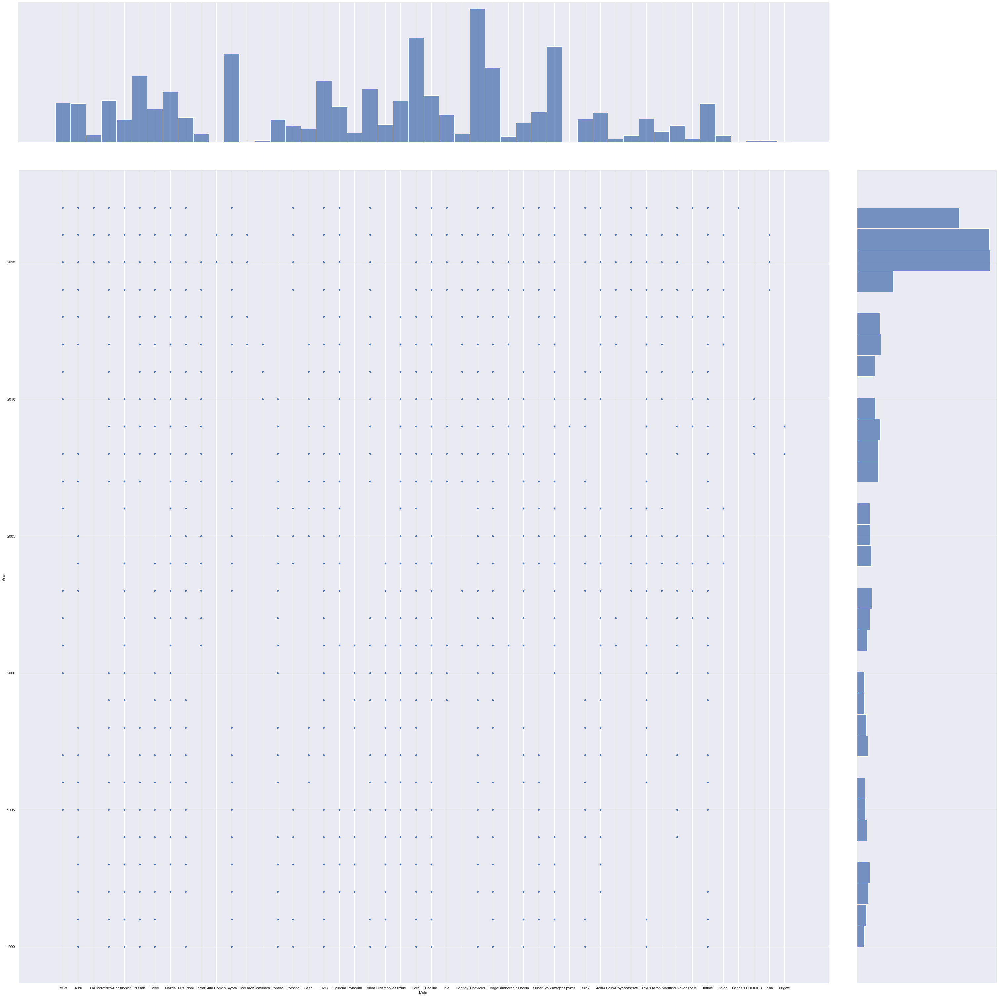

In [50]:
jointDF5 = pd.concat([year,make], axis = 1).reindex(year.index)
sb.jointplot(x = "Make", y = "Year", data = jointDF5, height =42)
plt.xticks(rotation=45)

,Make
0,BMW
1,BMW
2,BMW
3,BMW
4,BMW
5,BMW
6,BMW
7,BMW
8,BMW
9,BMW
